What is object detection --> https://www.ibm.com/think/topics/object-detection

What is YOLO --> https://docs.ultralytics.com/

What is the dataset --> https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/data

<h2>Part 1</h2>

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("davidbroberts/brain-tumor-object-detection-datasets")

print("Path to dataset files:", path)


#References --> David Roberts, datasets=https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/data
#References --> DeepUnderstanding, datasets=https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/data

Path to dataset files: /kaggle/input/brain-tumor-object-detection-datasets


<h2>Part 2</h2>

In [2]:
!pip install ultralytics
#References --> https://docs.ultralytics.com/quickstart/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 69.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.9.90
    Uninstalling nvidia-curand-cu12-10.3.

<h2>Part 3 - First model training for first dataset</h2>

In [3]:
with open("/kaggle/working/data.yaml","w") as file: 
    file.write("path: /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class\n")                    
    file.write("train: /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/train\n")
    file.write("val: /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/test\n")
    file.write("nc: 2\n")
    file.write("names: ['negative','positive']")

#References --> My python knowledge + Some editings

<h2>Part 4</h2>

In [4]:
from ultralytics import YOLO

# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolo11n.pt")

results = model.train(data="/kaggle/working/data.yaml", epochs=10)

#References --> https://docs.ultralytics.com/usage/python/

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 103MB/s]


Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

100%|██████████| 755k/755k [00:00<00:00, 22.5MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/labels/train... 296 images, 14 backgrounds, 0 corrupt: 100%|██████████| 310/310 [00:02<00:00, 151.15it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/labels is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.0±0.6 MB/s, size: 9.0 KB)


val: Scanning /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/labels/test... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 115.04it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.42G      1.415      4.605      1.329          6        640: 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all         75         81    0.00332      0.407    0.00234    0.00162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.78G      1.245      3.346      1.154          5        640: 100%|██████████| 20/20 [00:04<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         75         81    0.00216      0.272      0.163     0.0791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.78G      1.143      2.905      1.091          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.72it/s]

                   all         75         81          1     0.0491      0.267      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.78G      1.141      2.729      1.094          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         75         81          1     0.0694      0.684      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.78G      1.143      2.552      1.065          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         75         81      0.547      0.208      0.393      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.78G      1.066        2.3      1.048          5        640: 100%|██████████| 20/20 [00:04<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         75         81     0.0582      0.494     0.0659     0.0408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.78G       1.06      2.173      1.029          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.76it/s]

                   all         75         81      0.593      0.504      0.641      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.78G      1.022      1.999      1.031          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.32it/s]

                   all         75         81      0.893      0.414      0.791       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.78G     0.9836      1.891      1.017          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.20it/s]

                   all         75         81      0.753      0.865      0.817      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.78G      0.913      1.747     0.9923          6        640: 100%|██████████| 20/20 [00:04<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.00it/s]

                   all         75         81      0.741      0.779      0.772      0.534



10 epochs completed in 0.015 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]


                   all         75         81      0.753      0.866      0.815      0.593
              negative         75         81      0.753      0.866      0.815      0.593


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/train


<h2>Part 5</h2>

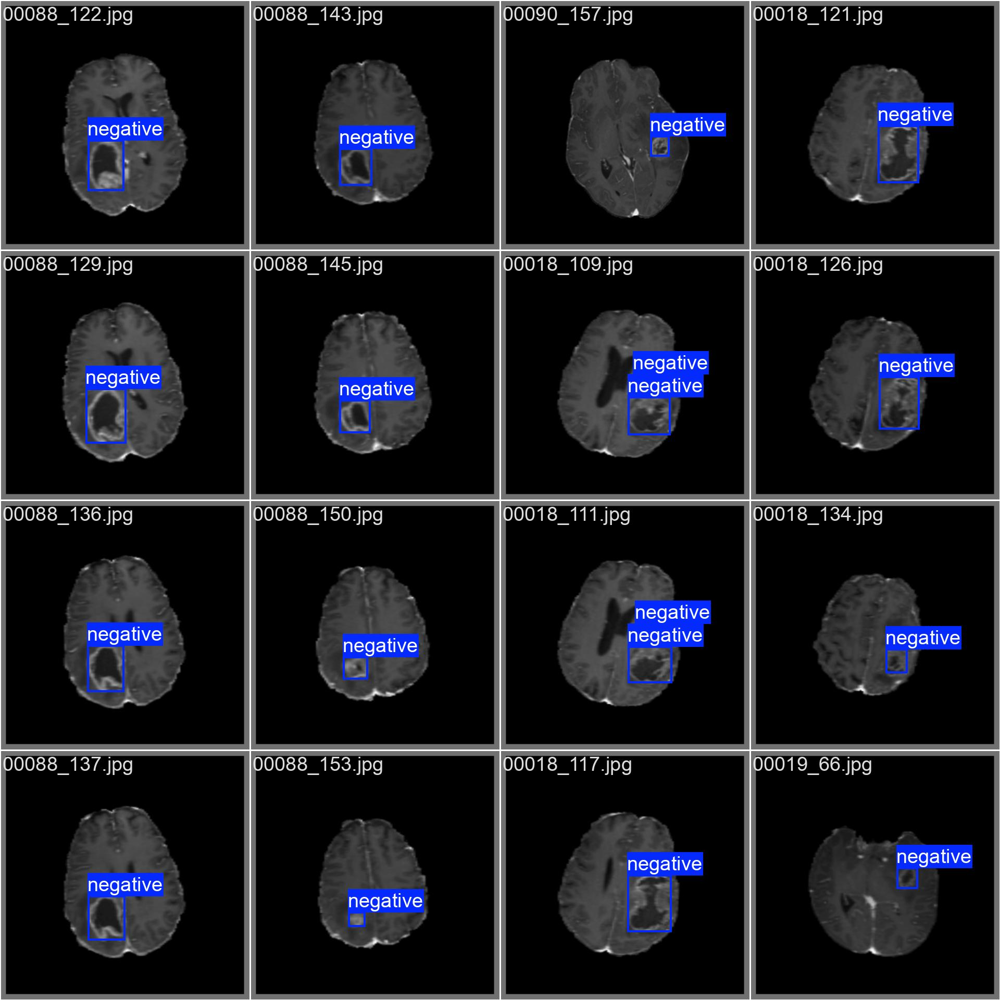

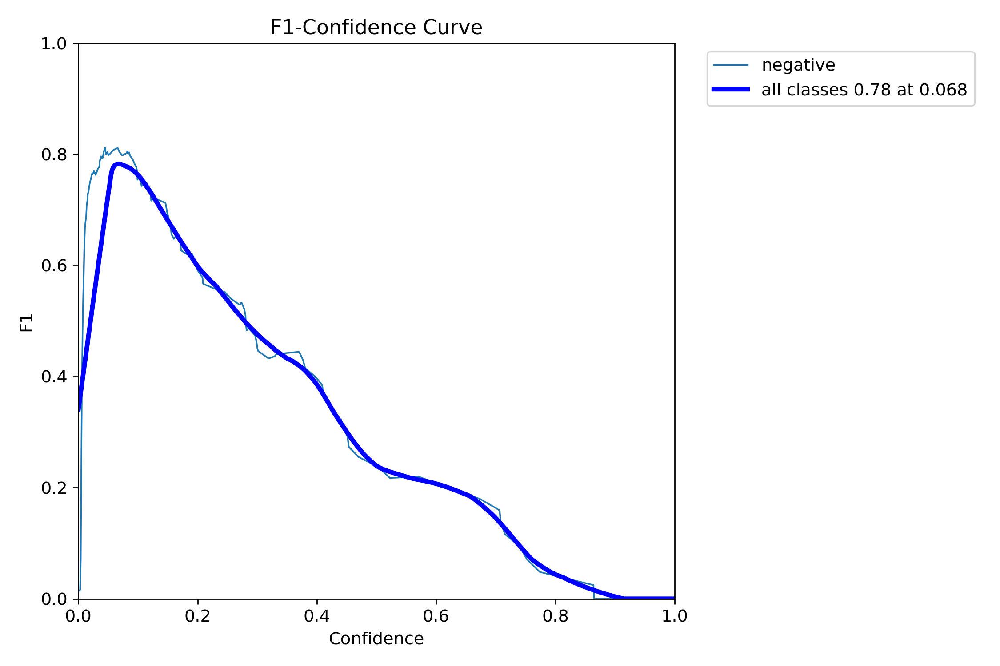

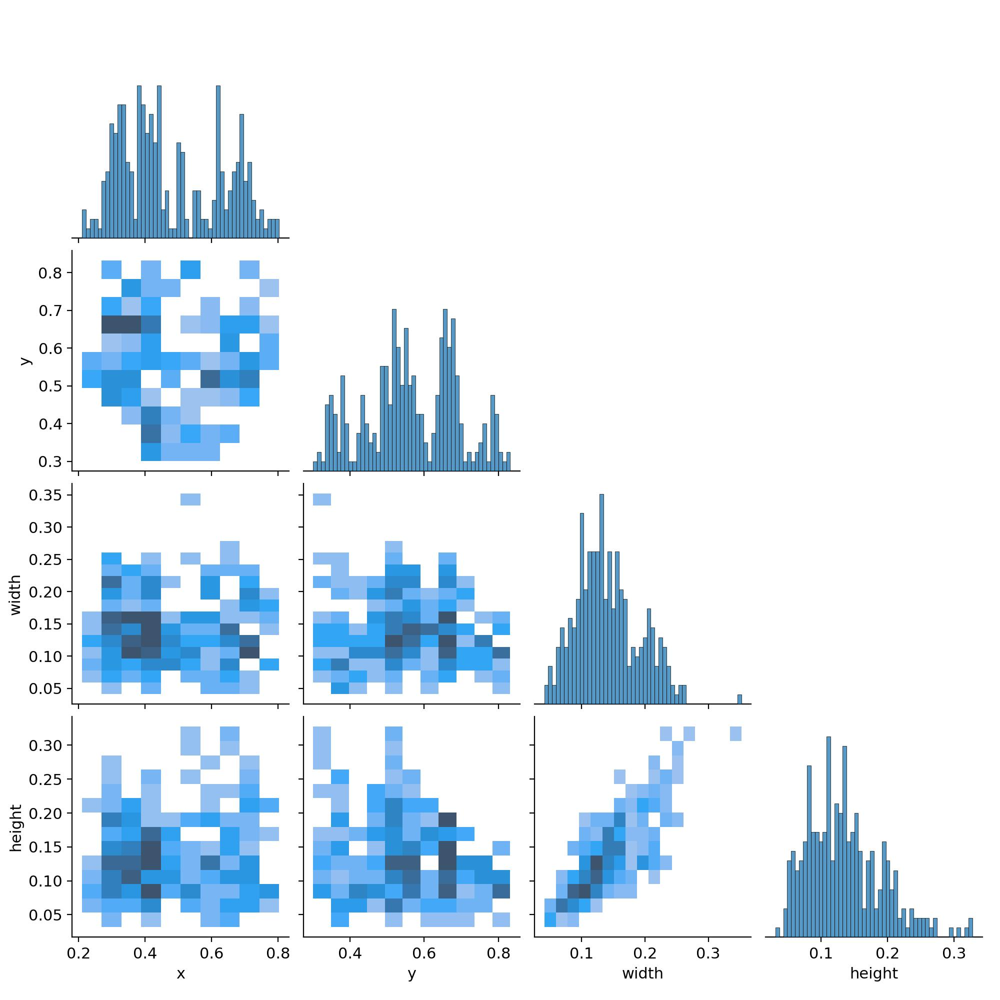

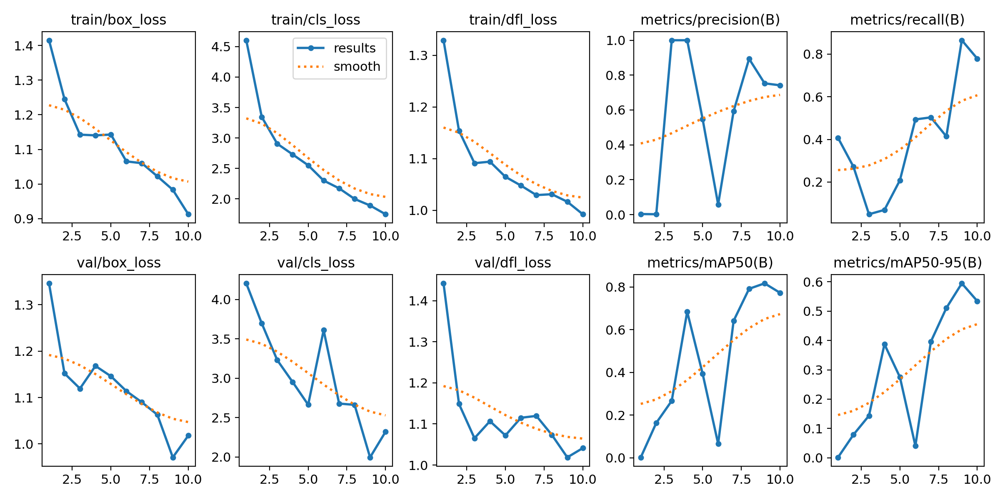

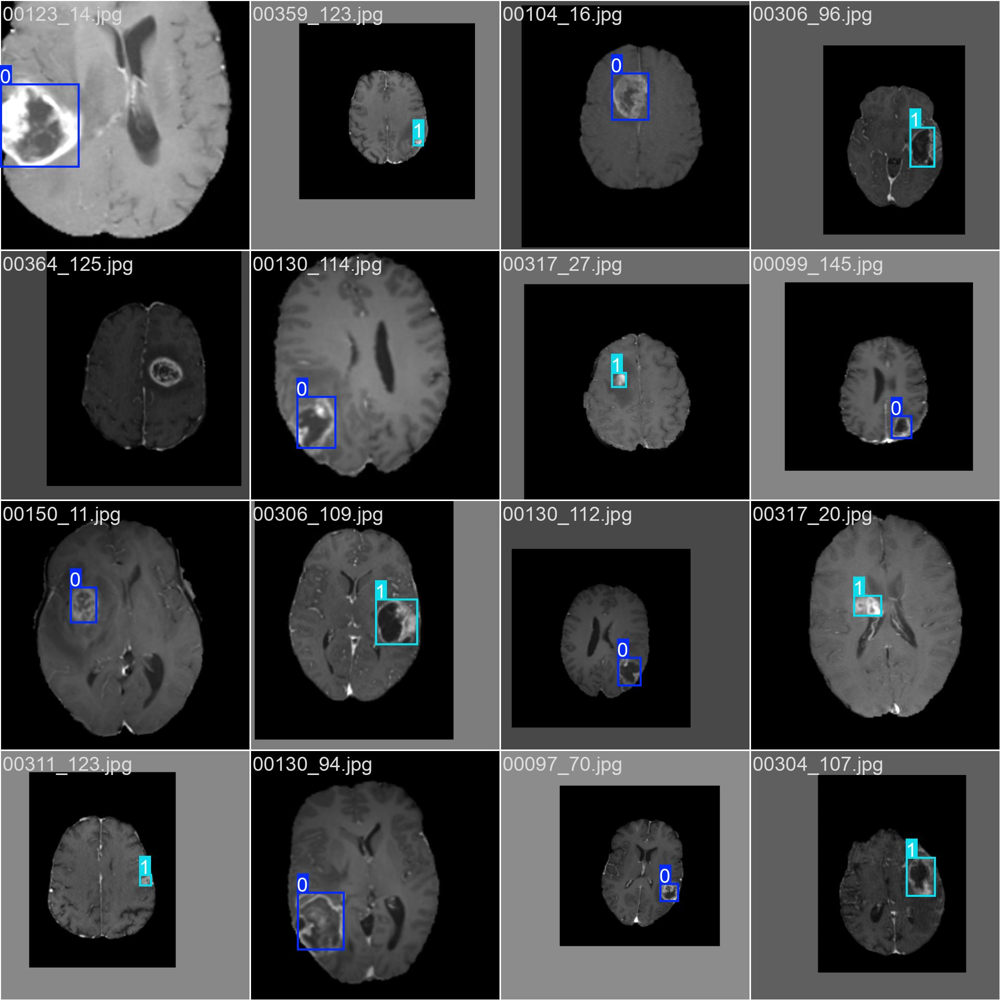

...

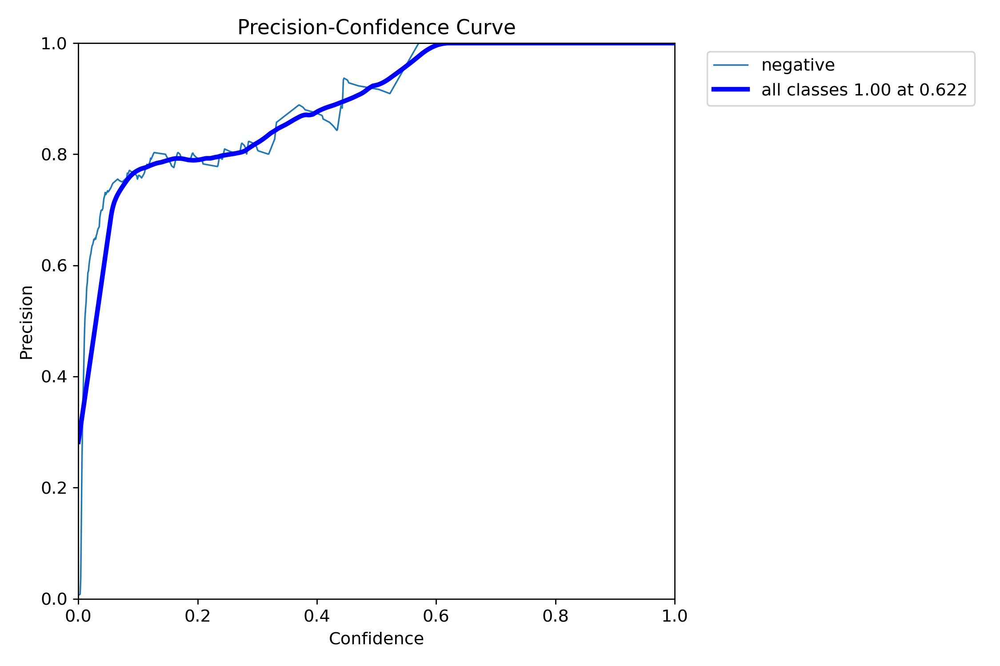

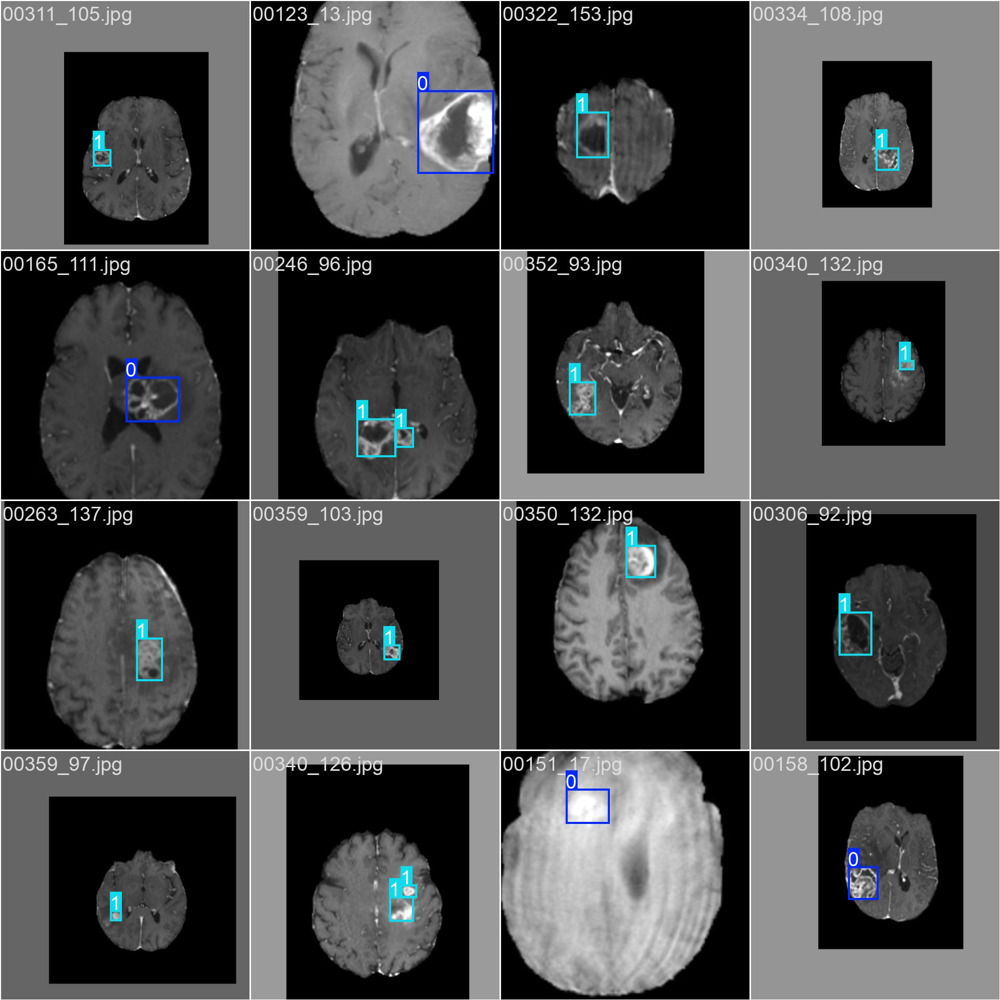

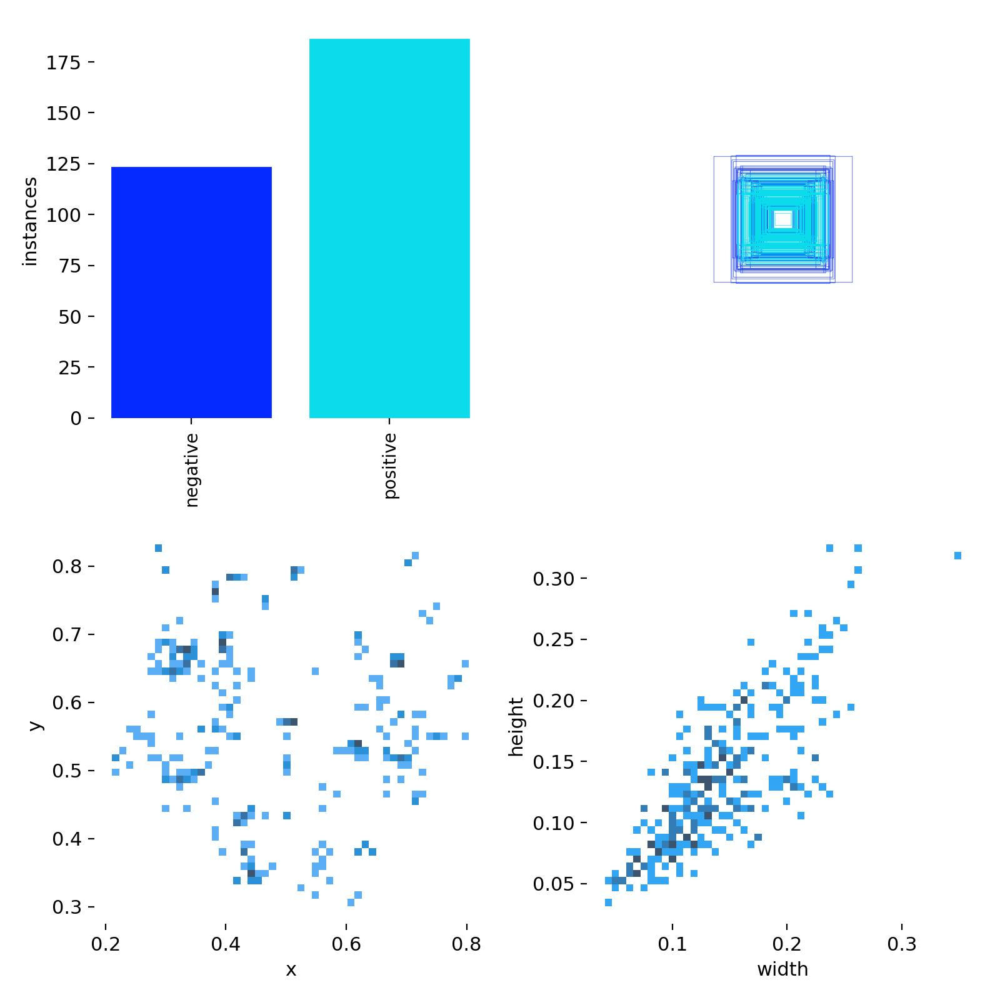

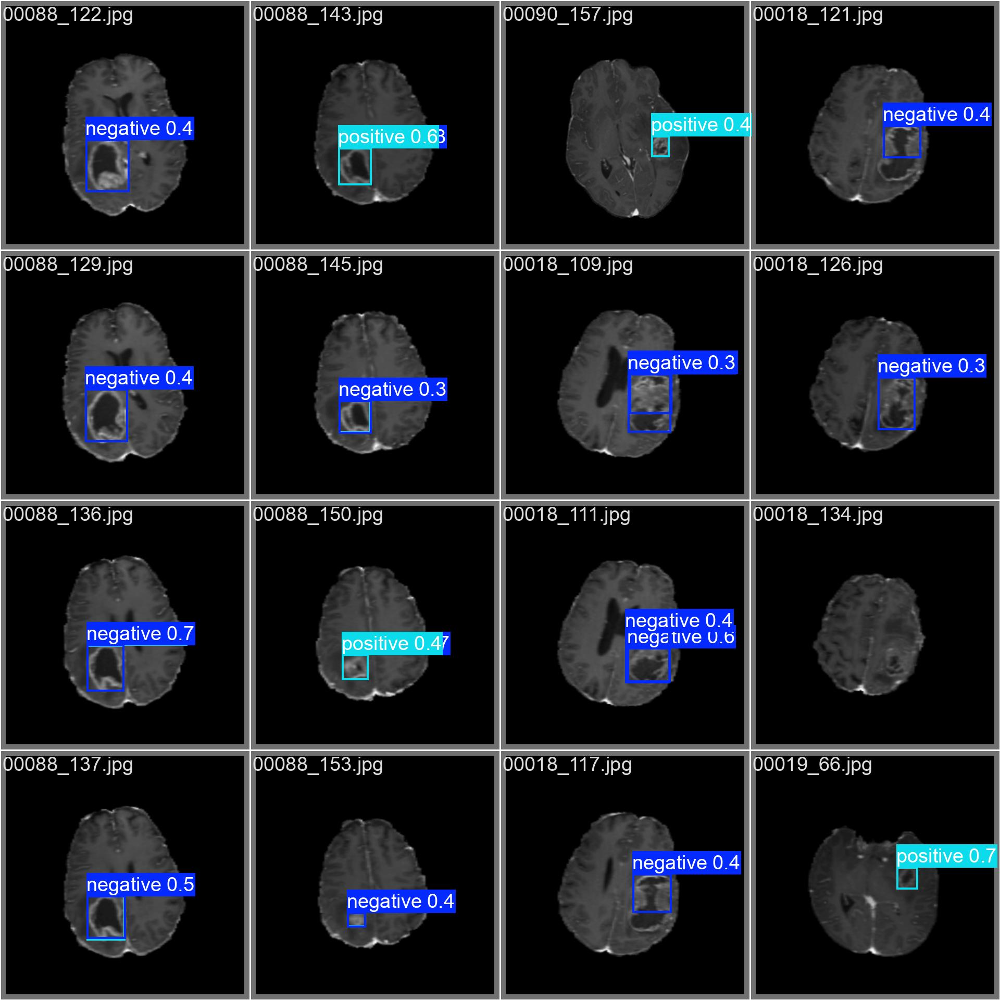

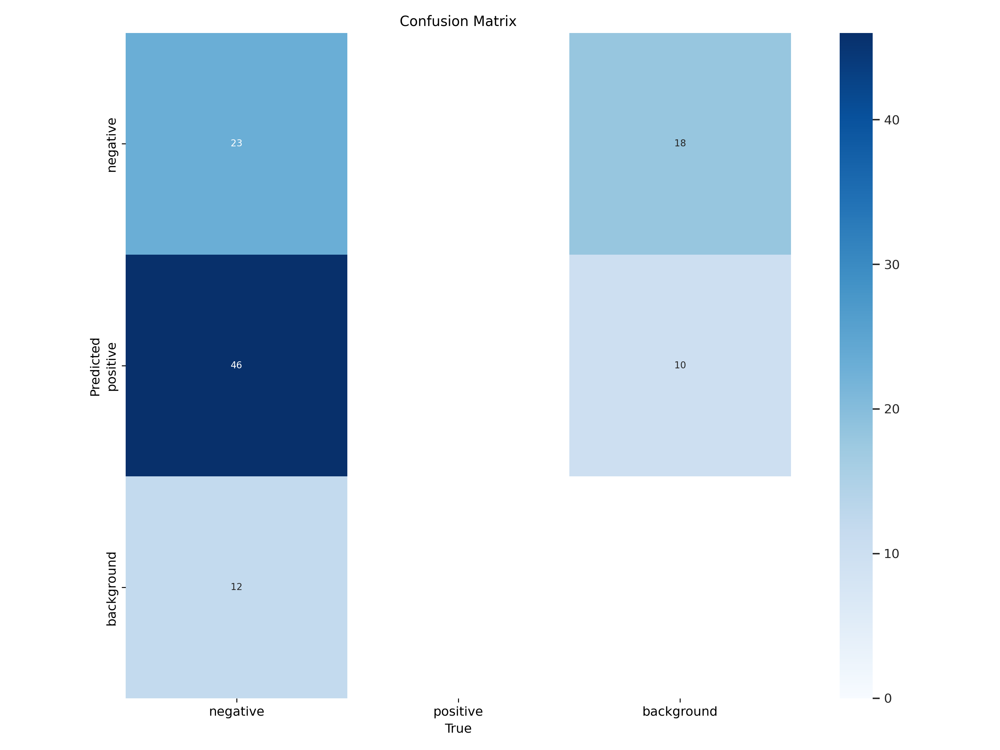

In [5]:
import os
from IPython.display import Image, display

path='/kaggle/working/runs/detect/train'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
    display(Image(filename=path+'/'+image[i]))

    
#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 6</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/test/00018_134.jpg: 640x640 1 negative, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


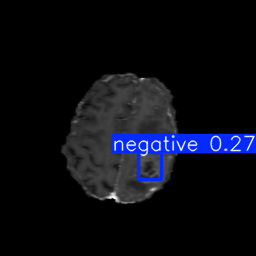

In [6]:
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  

results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/test/00018_134.jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 7</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/test/00084_137.jpg: 640x640 (no detections), 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


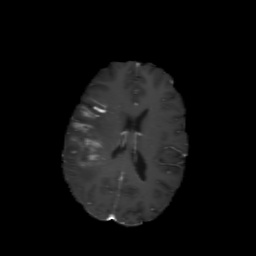

In [7]:
results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/axial_t1wce_2_class/images/test/00084_137.jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 8 - Second model training for second dataset</h2>

In [8]:
with open("/kaggle/working/coronal_data.yaml","w") as file: 
    file.write("path: /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class\n")                    
    file.write("train: /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/train\n")
    file.write("val: /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/test\n")
    file.write("nc: 2\n")
    file.write("names: ['negative','positive']")

#References --> My python knowledge + Some editings

<h2>Part 9</h2>

In [9]:
from ultralytics import YOLO

# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolo11n.pt")

results = model.train(data="/kaggle/working/coronal_data.yaml", epochs=10)

#References --> https://docs.ultralytics.com/usage/python/

Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/coronal_data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

train: Scanning /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/labels/train... 318 images, 1 backgrounds, 0 corrupt: 100%|██████████| 319/319 [00:01<00:00, 181.74it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2.0±0.7 MB/s, size: 12.5 KB)


val: Scanning /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/labels/test... 78 images, 0 backgrounds, 0 corrupt: 100%|██████████| 78/78 [00:00<00:00, 145.23it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       2.5G      1.507      4.768      1.374         17        640: 100%|██████████| 20/20 [00:05<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.59it/s]

                   all         78         83    0.00162      0.456     0.0105    0.00426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.86G      1.263      3.437      1.182         16        640: 100%|██████████| 20/20 [00:04<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.44it/s]

                   all         78         83    0.00269      0.764      0.202     0.0882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.86G      1.123      2.941      1.091         16        640: 100%|██████████| 20/20 [00:04<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.46it/s]

                   all         78         83    0.00272      0.755      0.164      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.86G      1.069      2.651      1.087         15        640: 100%|██████████| 20/20 [00:04<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.26it/s]

                   all         78         83      0.138      0.423      0.173      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.86G       1.06      2.472      1.043         17        640: 100%|██████████| 20/20 [00:04<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.53it/s]

                   all         78         83      0.494      0.277      0.346      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.86G      1.053      2.297      1.053         15        640: 100%|██████████| 20/20 [00:04<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.61it/s]

                   all         78         83      0.477       0.66      0.481      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.86G     0.9905      2.096      1.029         17        640: 100%|██████████| 20/20 [00:04<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.79it/s]

                   all         78         83      0.436      0.672      0.462        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.86G     0.9616      2.024     0.9939         16        640: 100%|██████████| 20/20 [00:04<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         78         83      0.456      0.834       0.51      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.86G     0.9222      1.931     0.9955         16        640: 100%|██████████| 20/20 [00:04<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.47it/s]

                   all         78         83      0.466      0.859      0.507      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.86G     0.8978       1.89     0.9906         16        640: 100%|██████████| 20/20 [00:04<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.16it/s]

                   all         78         83      0.475      0.895      0.536      0.377



10 epochs completed in 0.015 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]


                   all         78         83      0.479      0.905      0.536      0.378
              negative         32         34      0.393      0.933      0.476      0.349
              positive         46         49      0.565      0.878      0.596      0.407


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/train2


<h2>Part 10</h2>

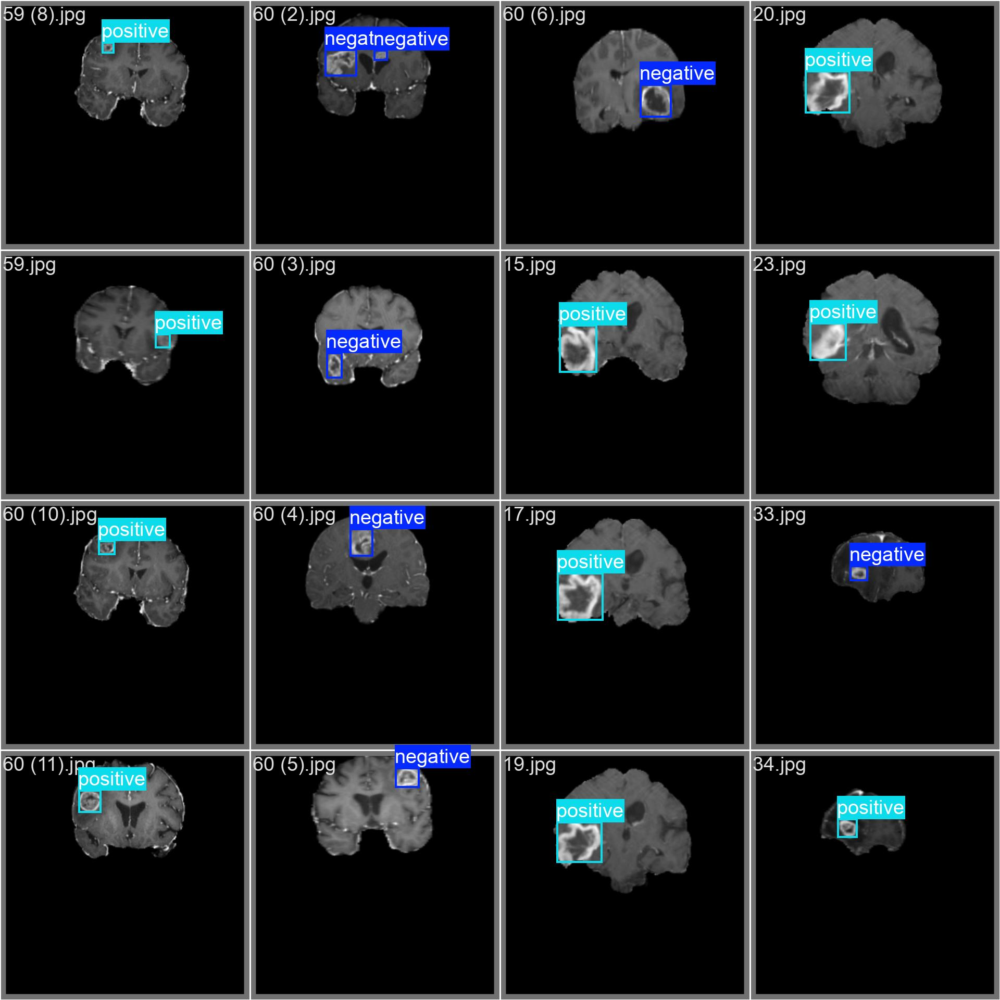

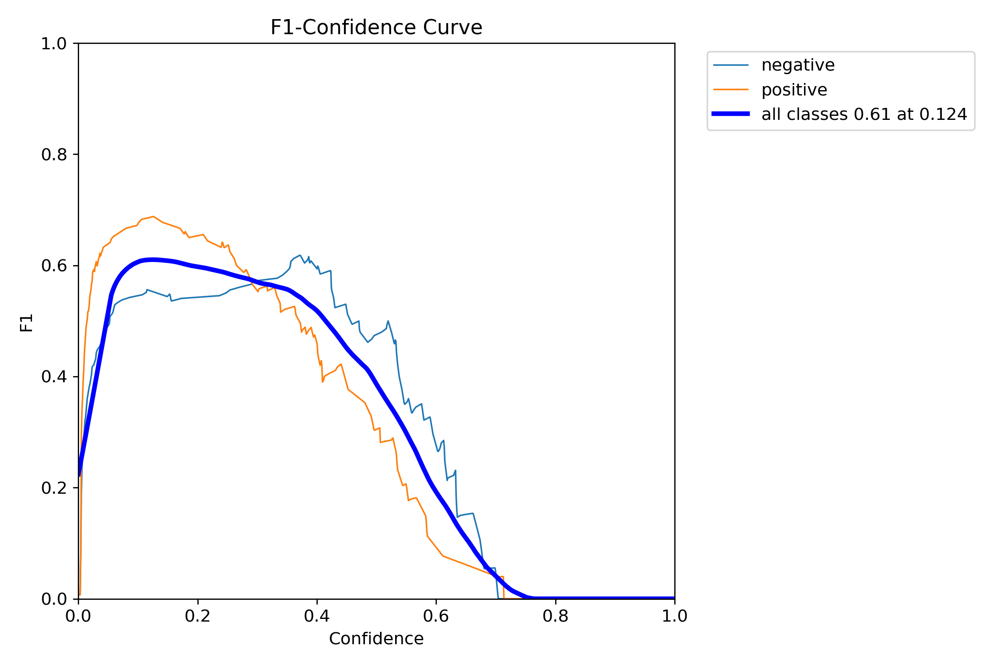

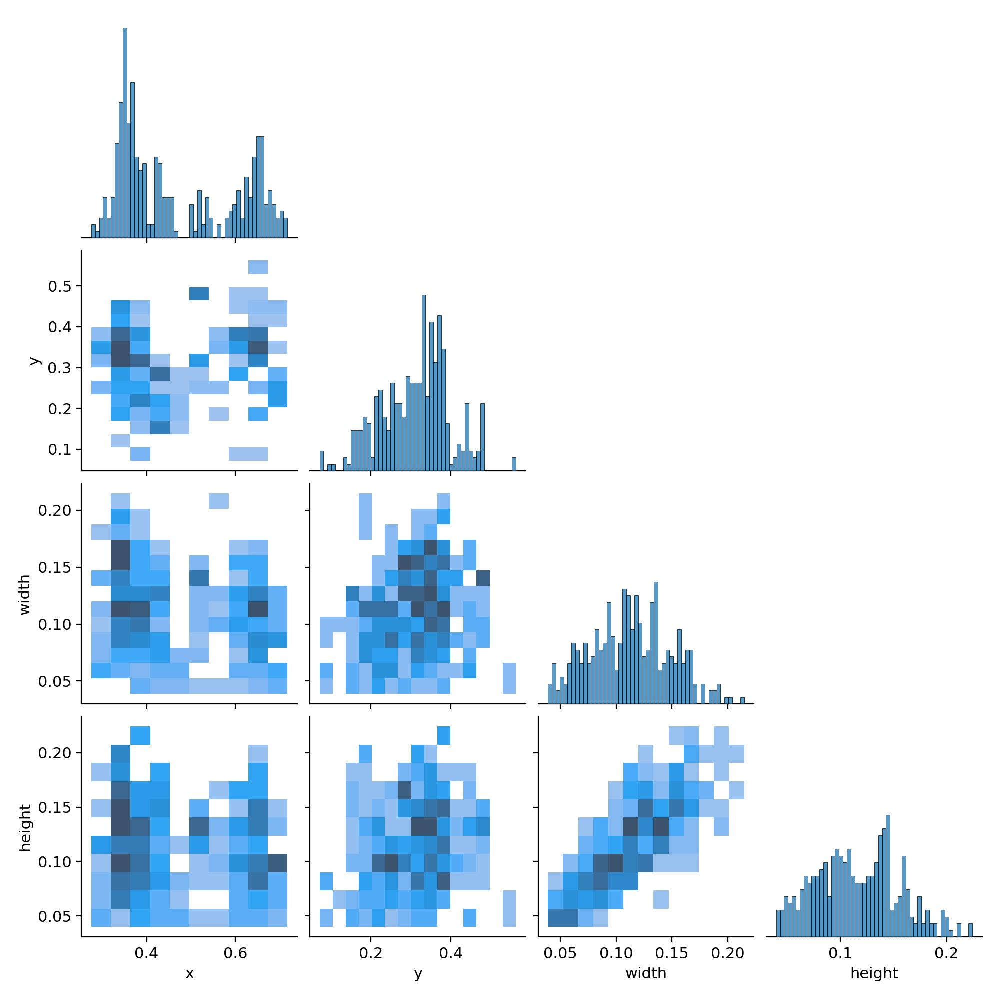

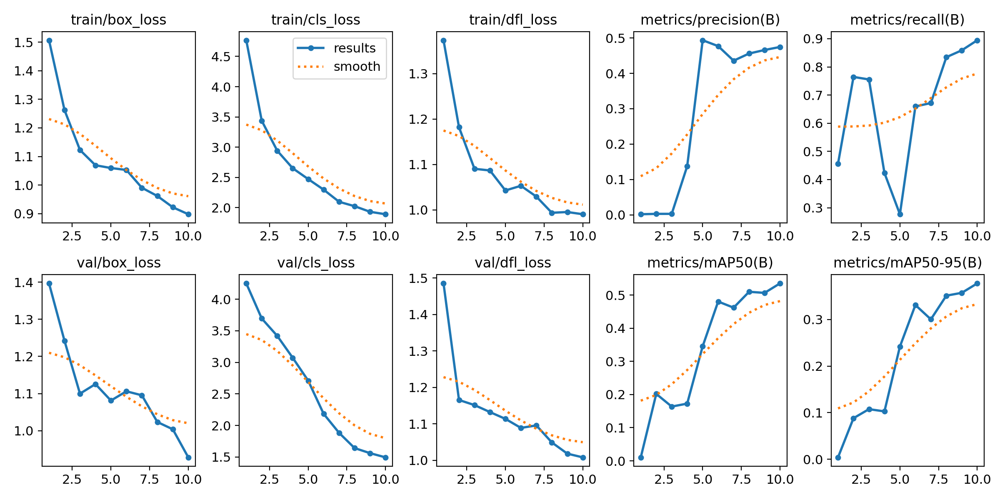

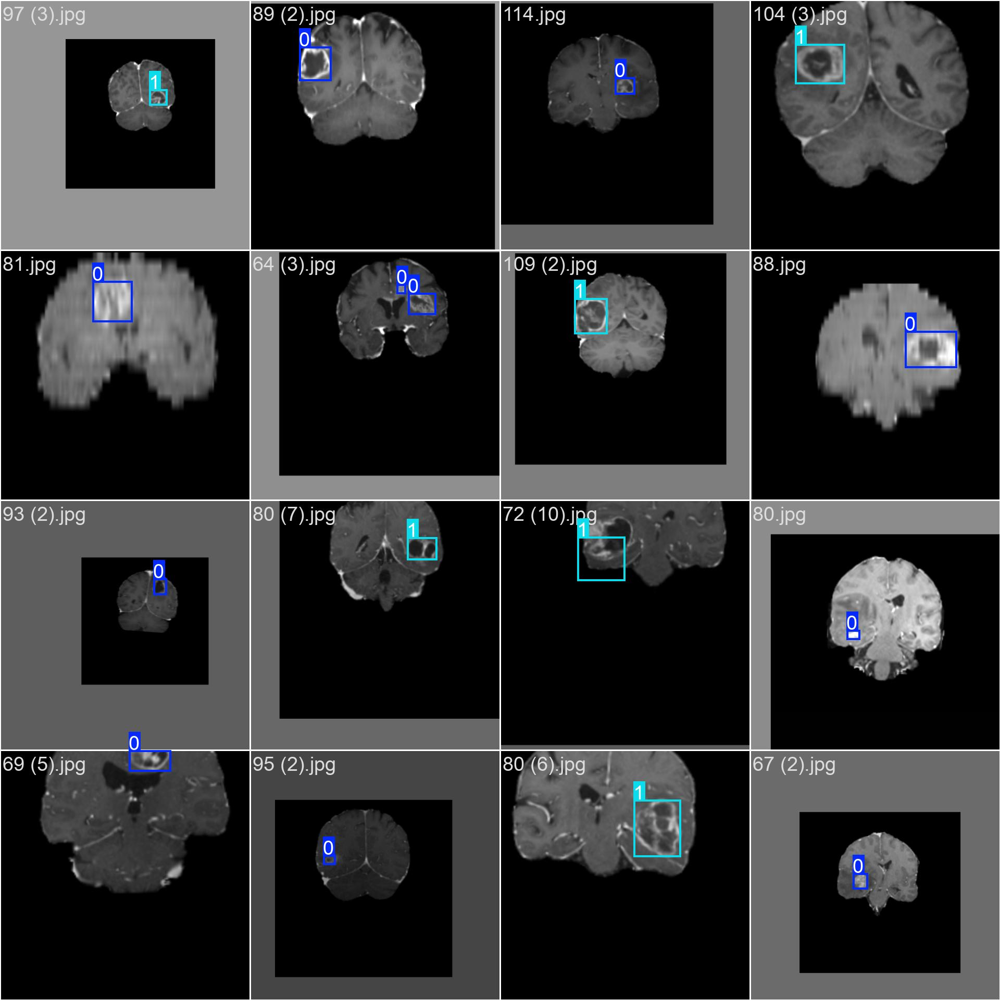

...

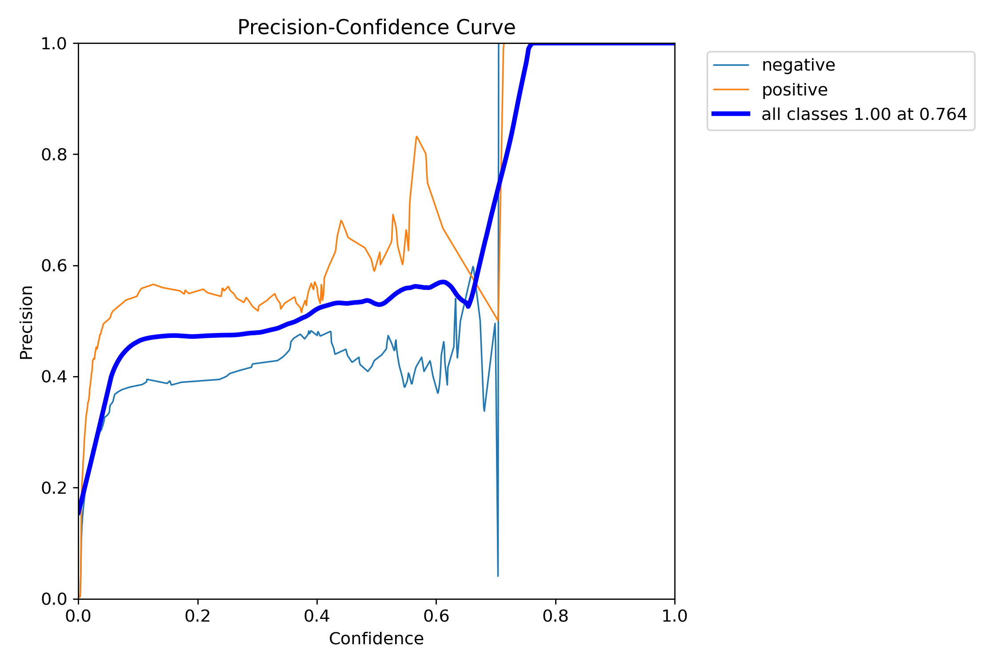

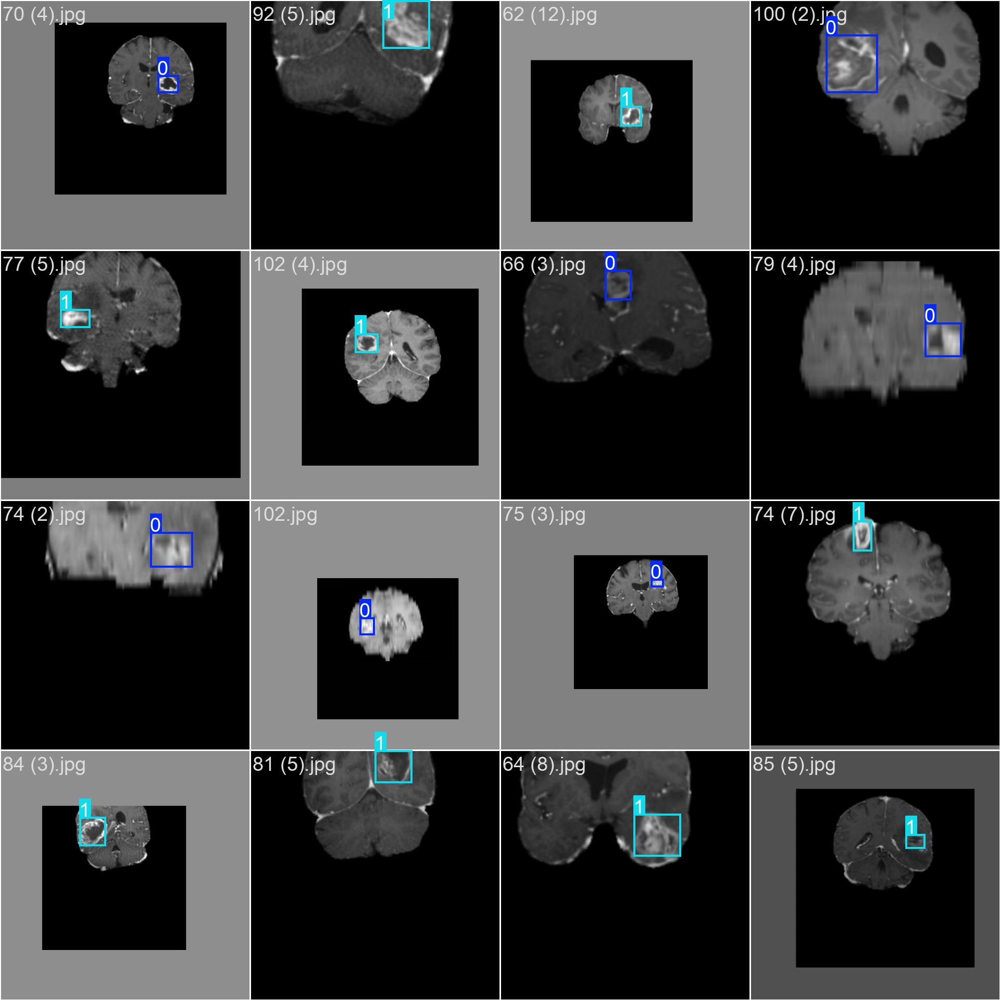

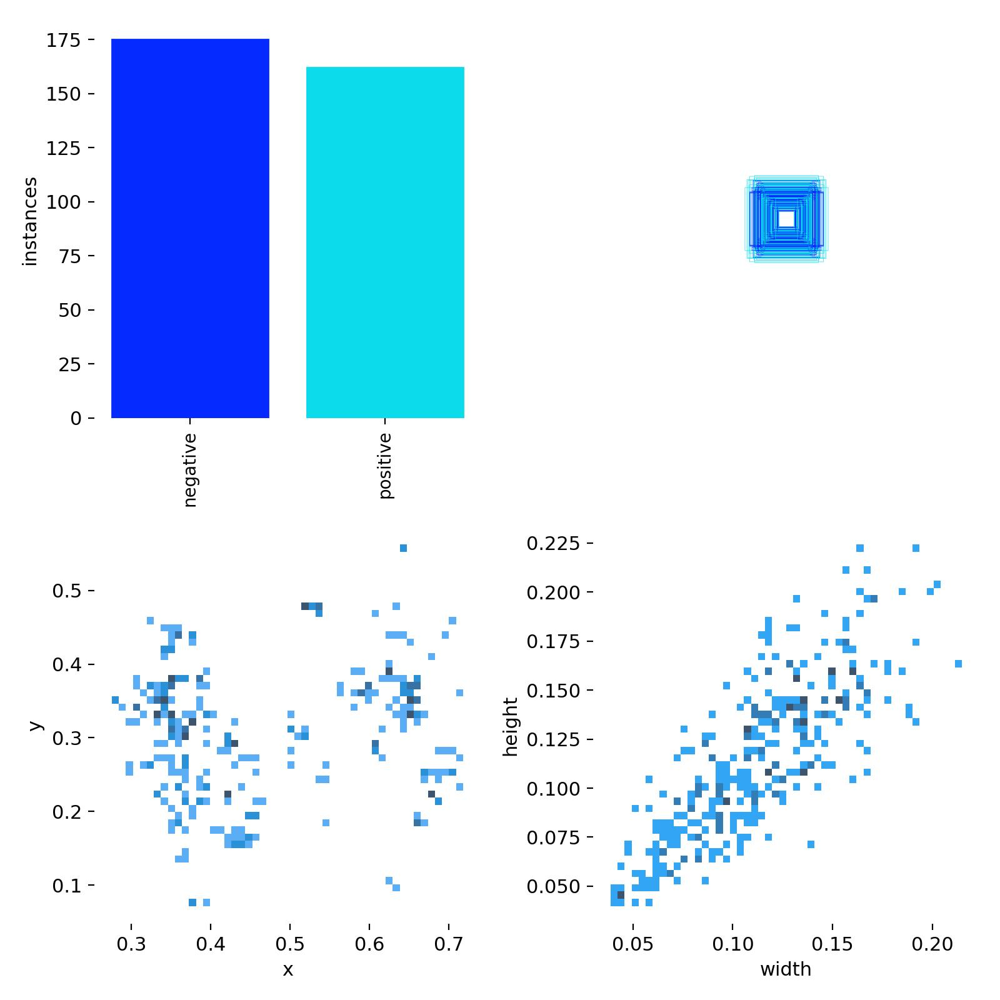

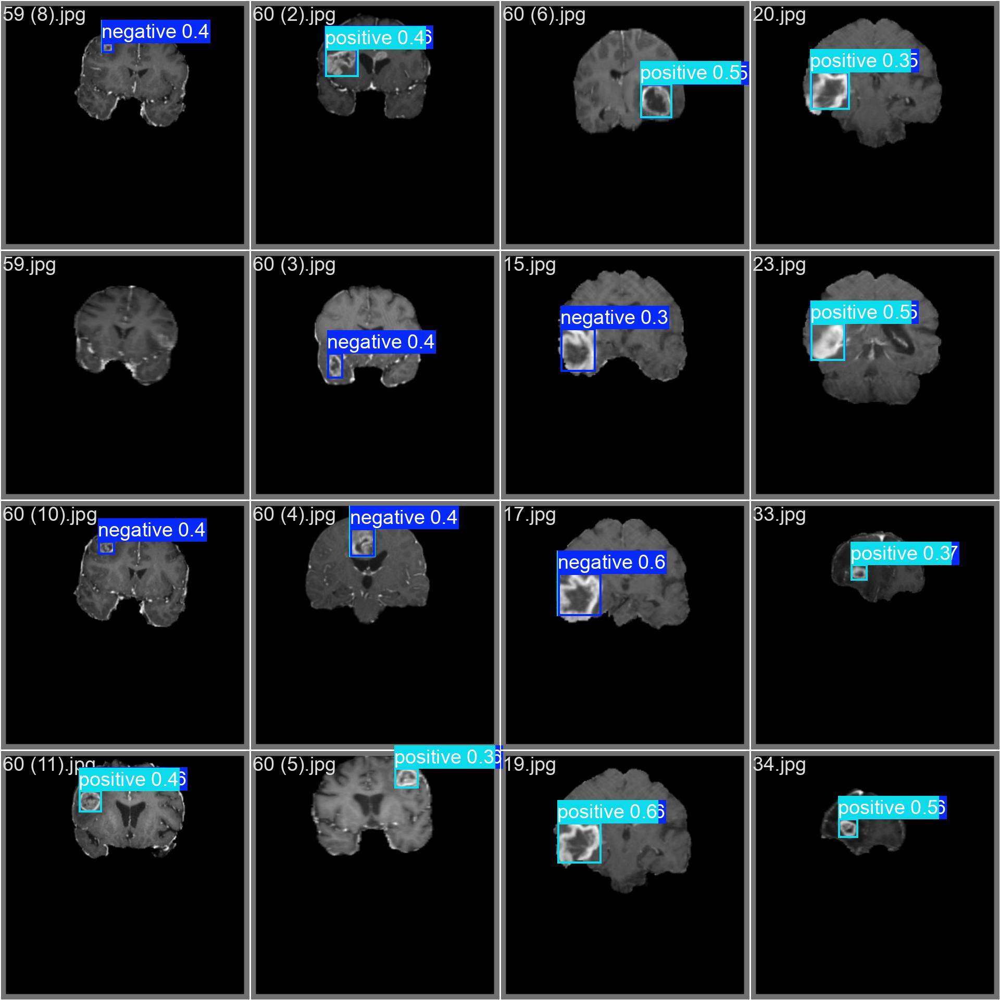

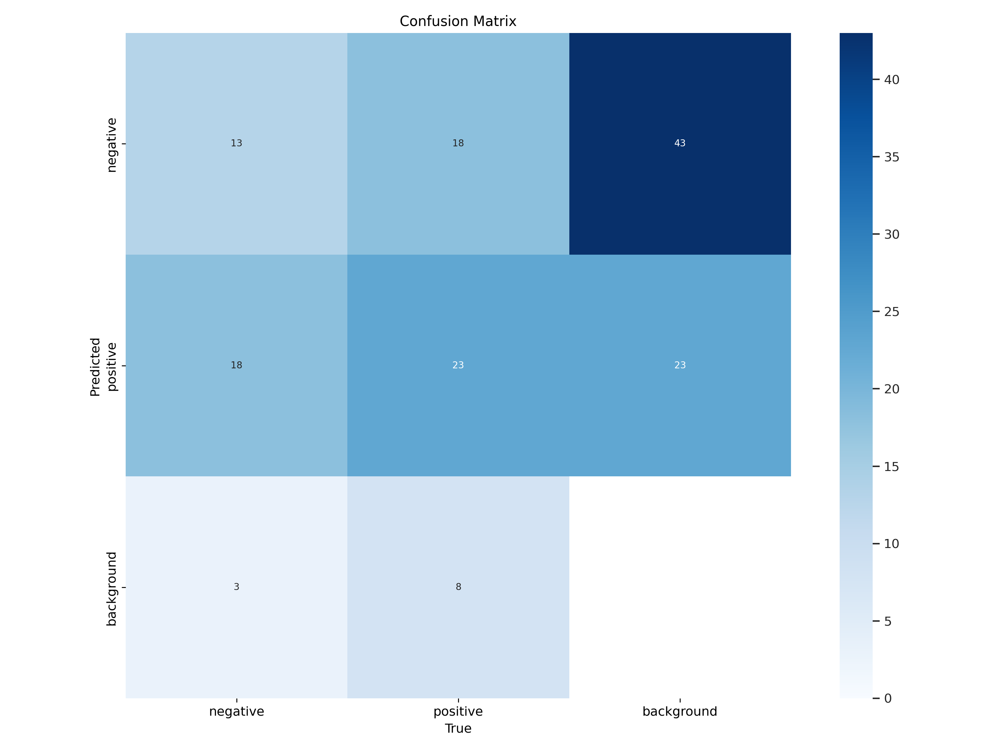

In [10]:
import os
from IPython.display import Image, display

path='/kaggle/working/runs/detect/train2'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
    display(Image(filename=path+'/'+image[i]))

    
#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 11</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/test/35.jpg: 640x640 1 negative, 1 positive, 8.3ms
Speed: 3.9ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


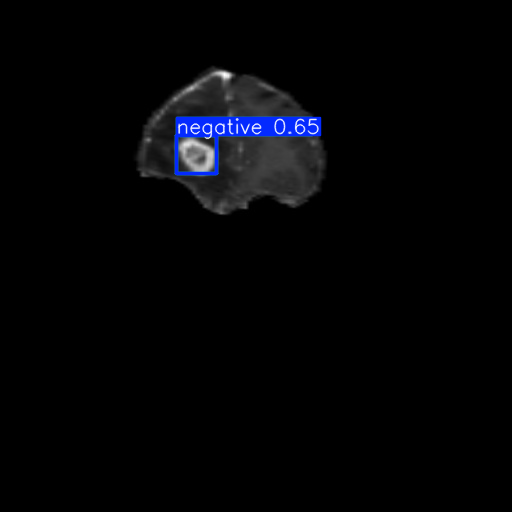

In [11]:
model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")  

results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/test/35.jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 12</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/test/60 (8).jpg: 640x640 1 positive, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


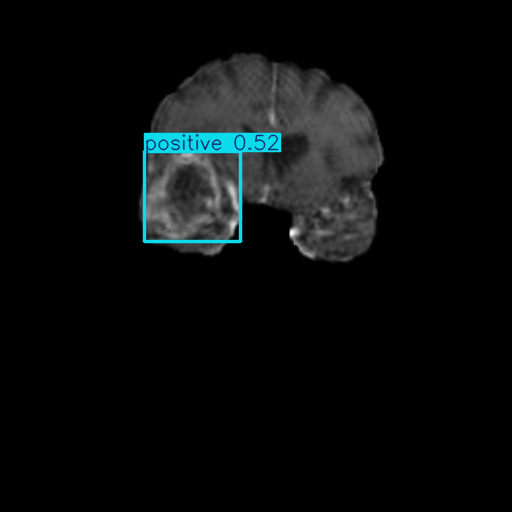

In [12]:
results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/coronal_t1wce_2_class/images/test/60 (8).jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 13 - Third model training for third dataset</h2>

In [13]:
with open("/kaggle/working/sagittal_data.yaml","w") as file: 
    file.write("path: /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class\n")                    
    file.write("train: /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/train\n")
    file.write("val: /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/test\n")
    file.write("nc: 2\n")
    file.write("names: ['negative','positive']")

#References --> My python knowledge + Some editings

<h2>Part 14</h2>

In [14]:
from ultralytics import YOLO

# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolo11n.pt")

results = model.train(data="/kaggle/working/sagittal_data.yaml", epochs=10)

#References --> https://docs.ultralytics.com/usage/python/

Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/sagittal_data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_bo

train: Scanning /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/labels/train... 264 images, 0 backgrounds, 0 corrupt: 100%|██████████| 264/264 [00:01<00:00, 180.49it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/labels is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2.1±1.2 MB/s, size: 17.1 KB)


val: Scanning /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/labels/test... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<00:00, 152.39it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.51G      1.596      4.864      1.478          8        640: 100%|██████████| 17/17 [00:05<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.59it/s]

                   all         70         77    0.00179      0.495     0.0528      0.024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.75G      1.333      3.533       1.21          8        640: 100%|██████████| 17/17 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.11it/s]

                   all         70         77      0.001      0.273     0.0993     0.0651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.76G      1.218      3.077      1.063         10        640: 100%|██████████| 17/17 [00:03<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.86it/s]

                   all         70         77    0.00343      0.936      0.315      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.76G      1.223       2.89      1.116          9        640: 100%|██████████| 17/17 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.85it/s]

                   all         70         77      0.419      0.102      0.194      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.76G       1.18      2.702      1.123          8        640: 100%|██████████| 17/17 [00:03<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.63it/s]

                   all         70         77       0.44      0.157      0.199      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.76G      1.147       2.59      1.076          8        640: 100%|██████████| 17/17 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         70         77      0.493      0.393      0.393      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.76G      1.114      2.471      1.059          8        640: 100%|██████████| 17/17 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.81it/s]

                   all         70         77      0.463      0.546      0.425      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.76G      1.042      2.326      1.026          9        640: 100%|██████████| 17/17 [00:03<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         70         77      0.414      0.717      0.499       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.76G     0.9634      2.195     0.9977          9        640: 100%|██████████| 17/17 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.94it/s]

                   all         70         77      0.424      0.702      0.509      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.76G      0.959       2.17      1.011          8        640: 100%|██████████| 17/17 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         70         77      0.459      0.715       0.52      0.388



10 epochs completed in 0.013 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]


                   all         70         77      0.458      0.715      0.521       0.39
              negative         35         39      0.429      0.641       0.45      0.321
              positive         35         38      0.487      0.789      0.592      0.459


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train3


<h2>Part 15</h2>

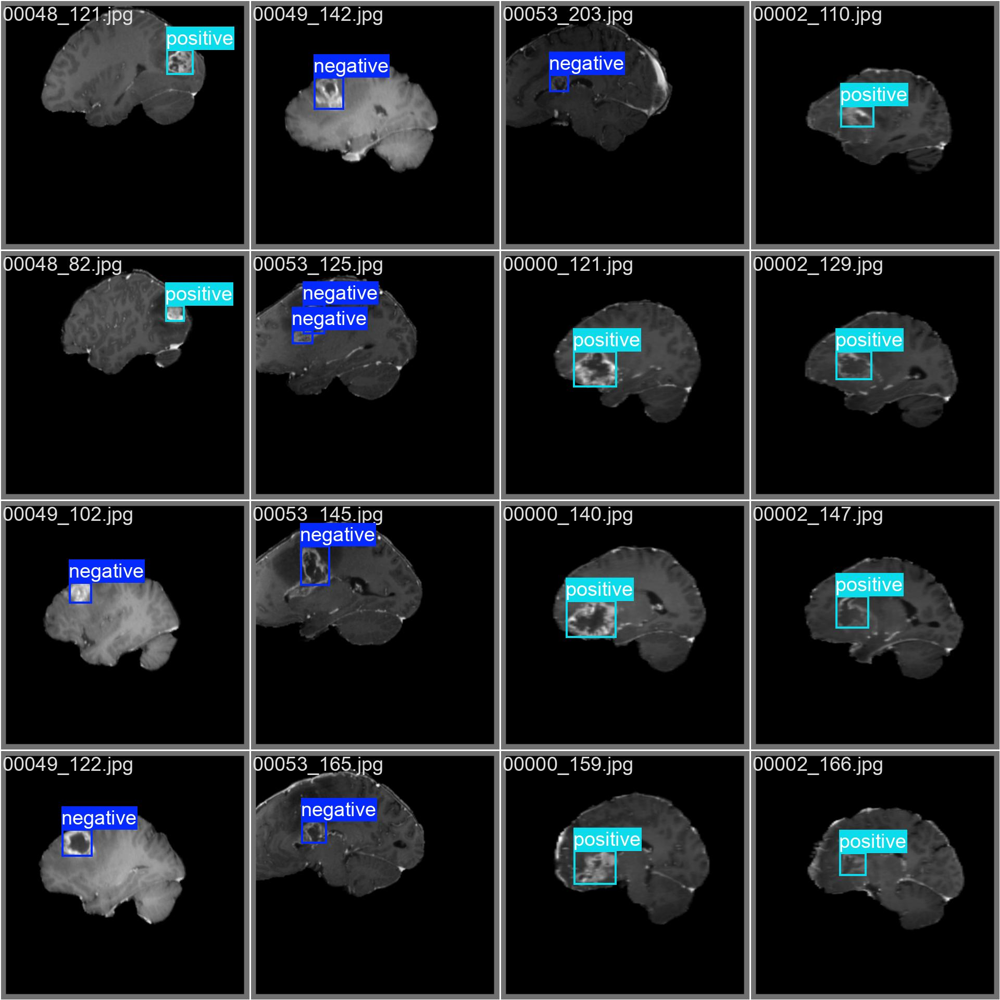

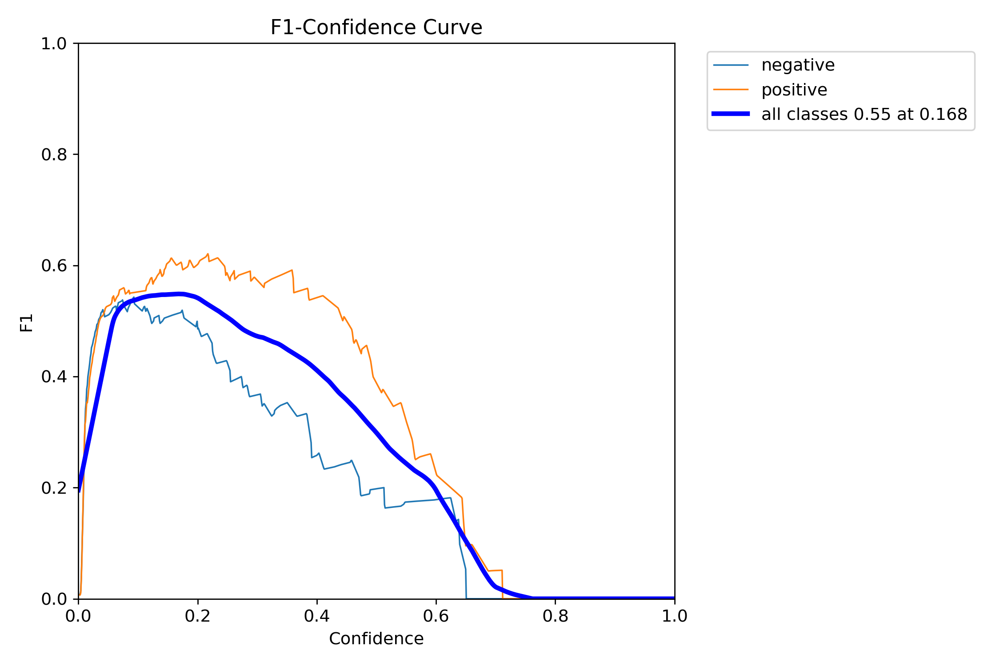

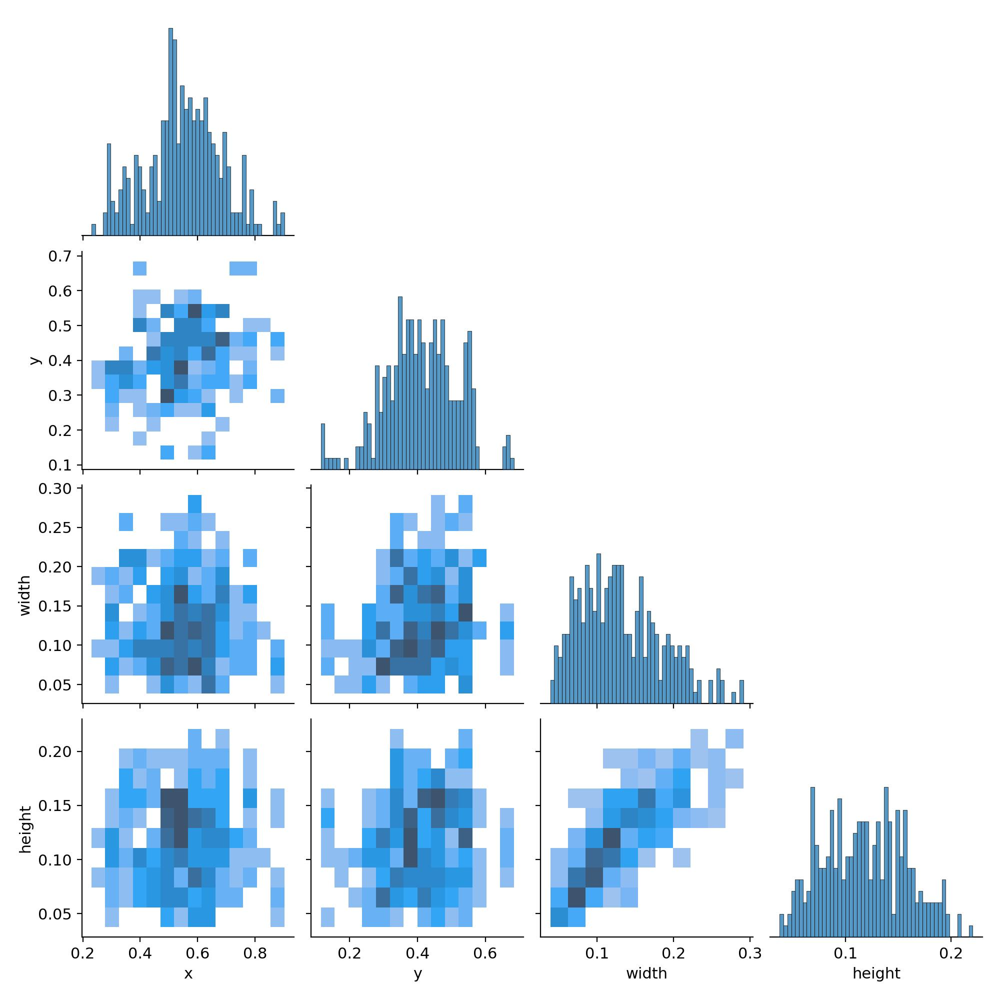

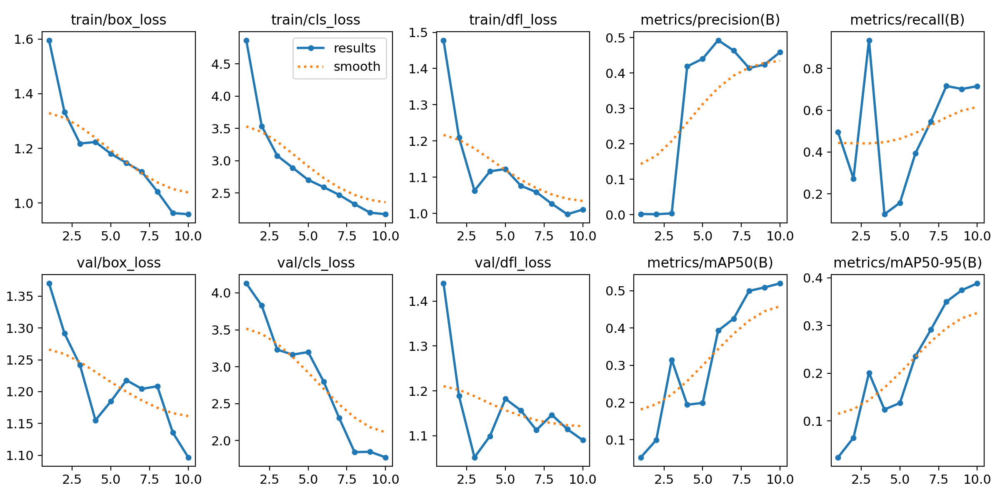

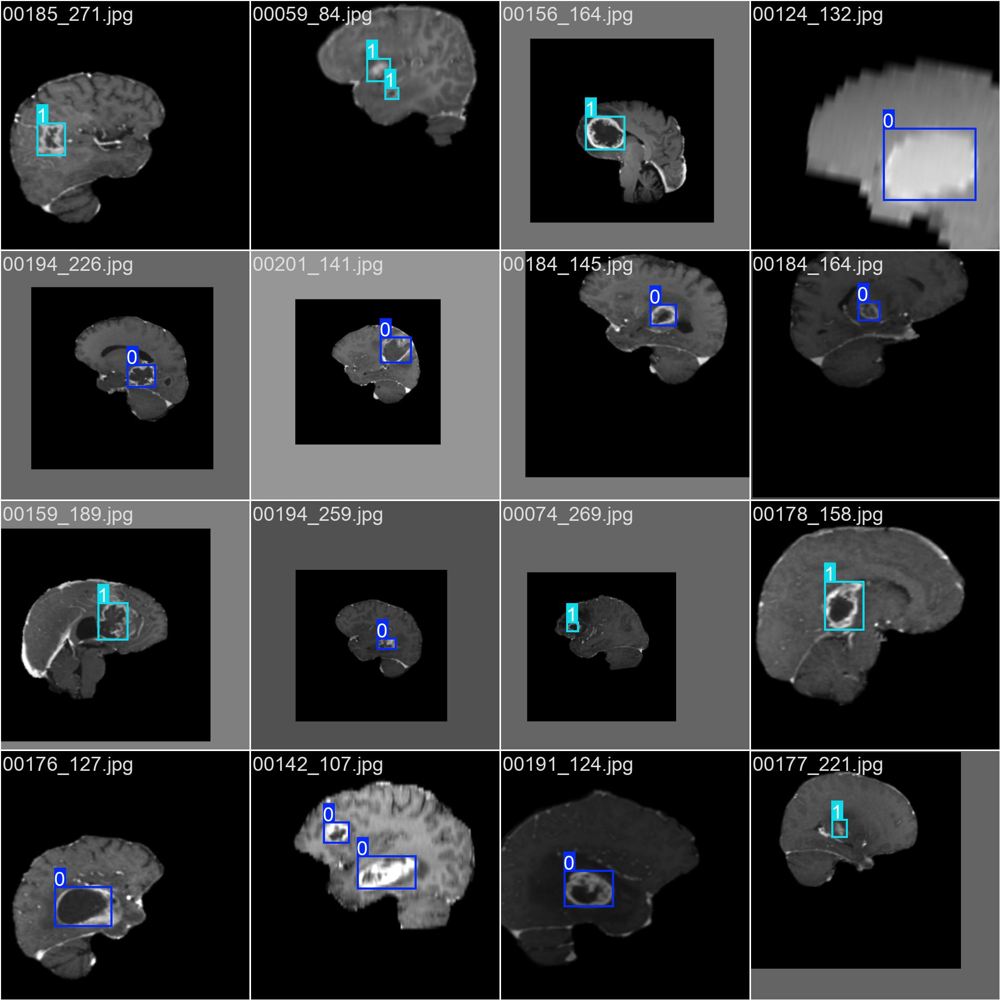

...

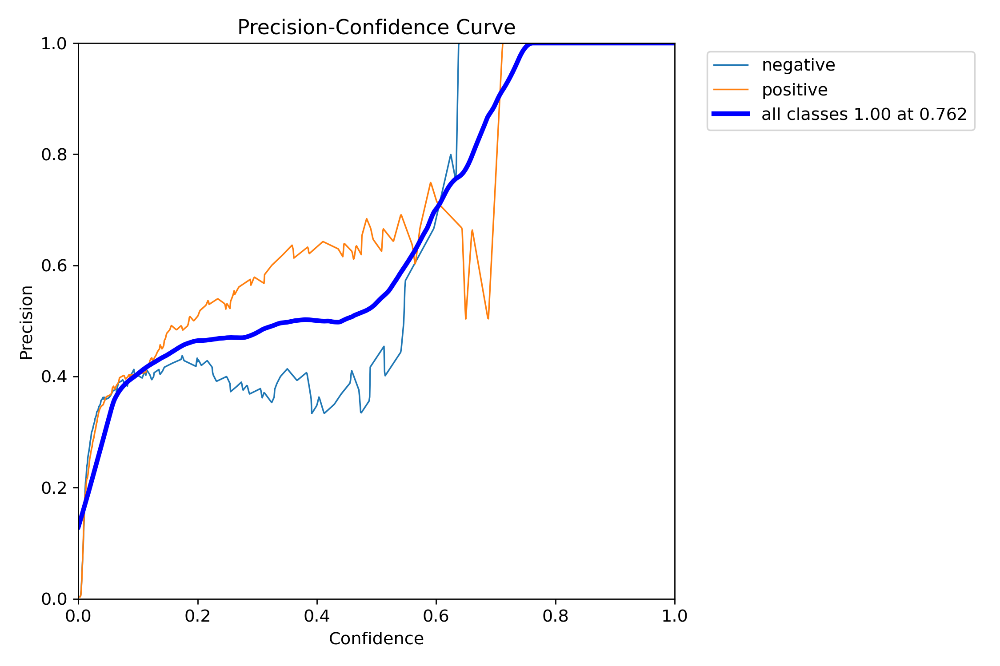

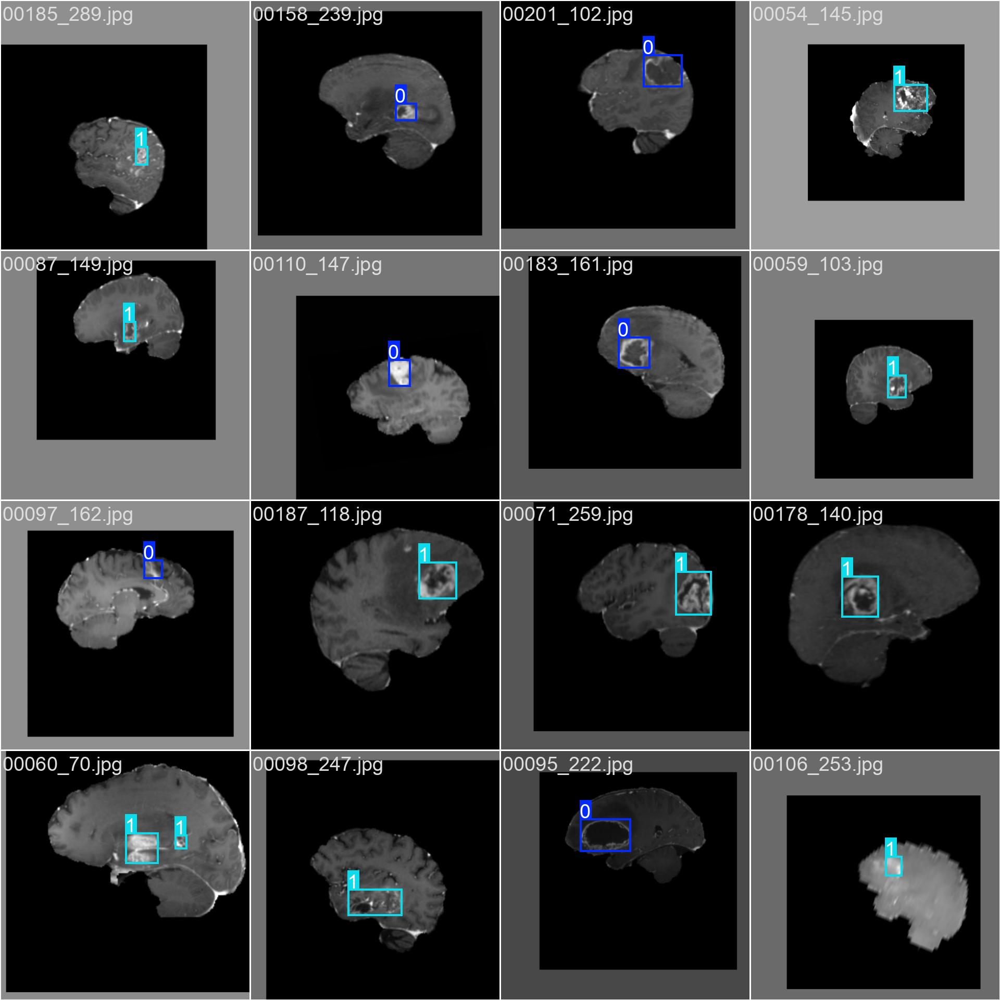

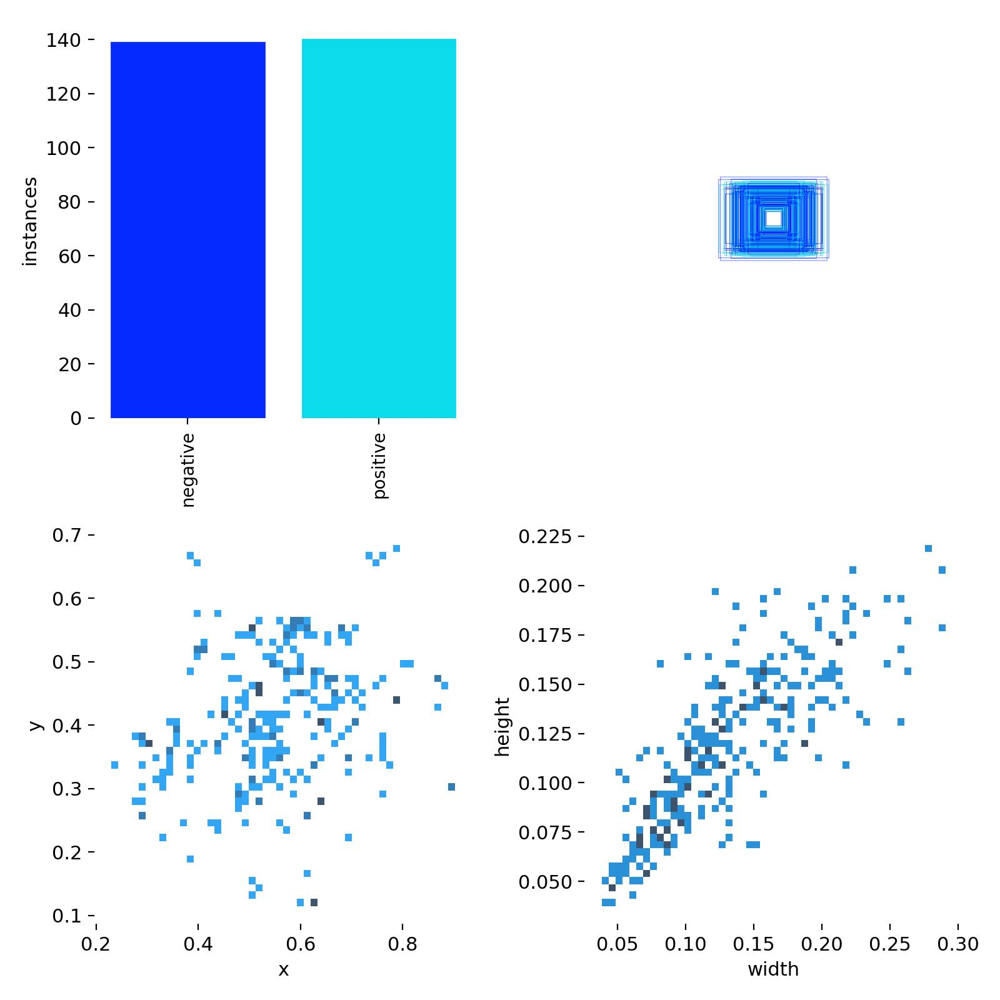

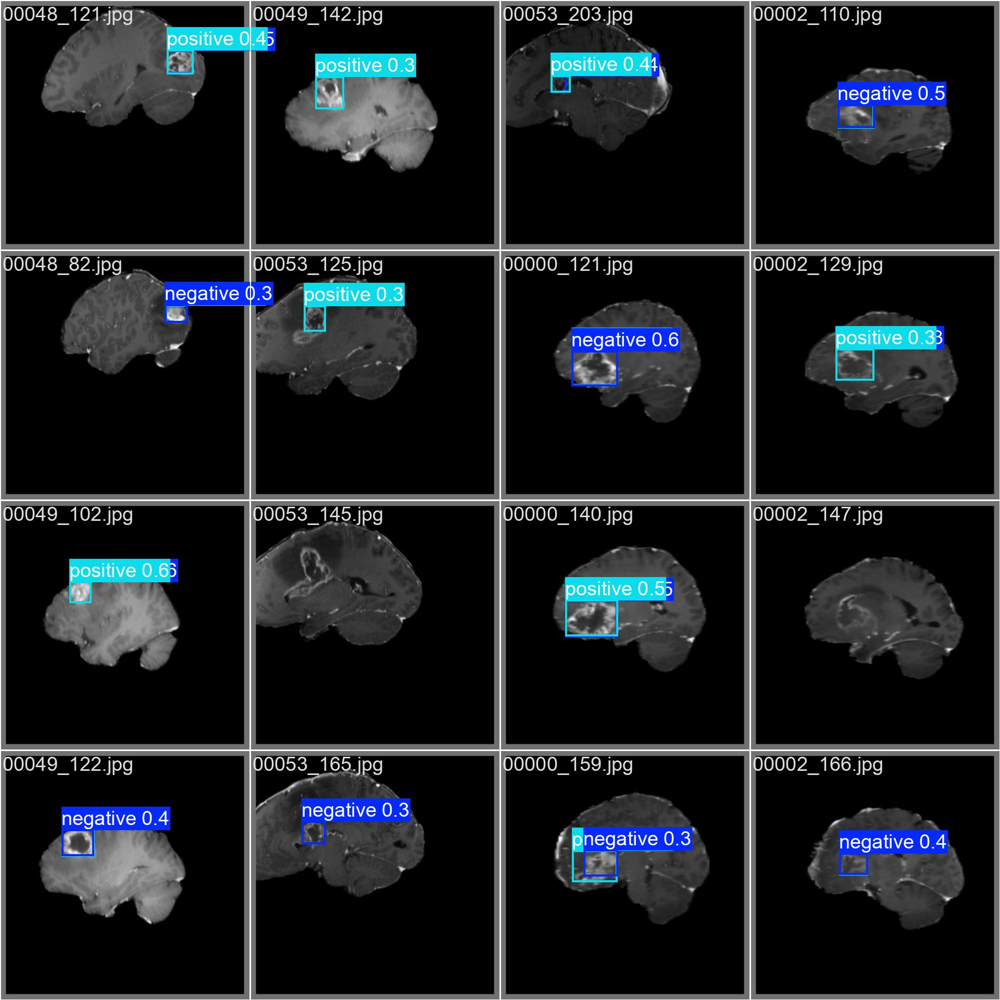

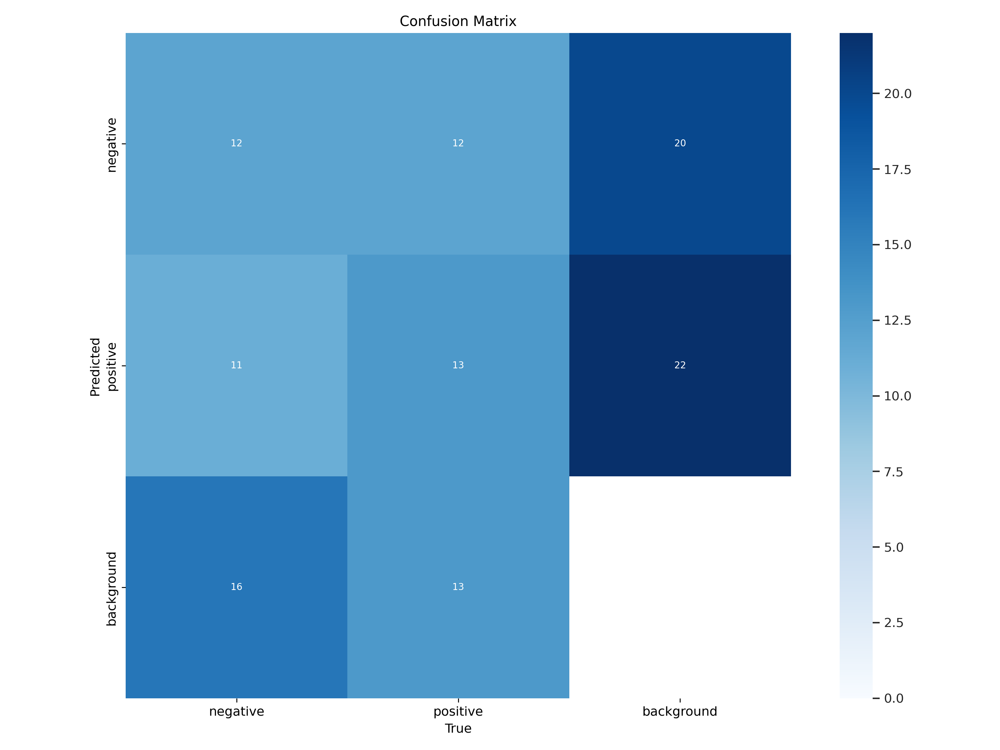

In [15]:
import os
from IPython.display import Image, display

path='/kaggle/working/runs/detect/train3'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
    display(Image(filename=path+'/'+image[i]))

    
#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 16</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/test/00003_192.jpg: 640x640 1 positive, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


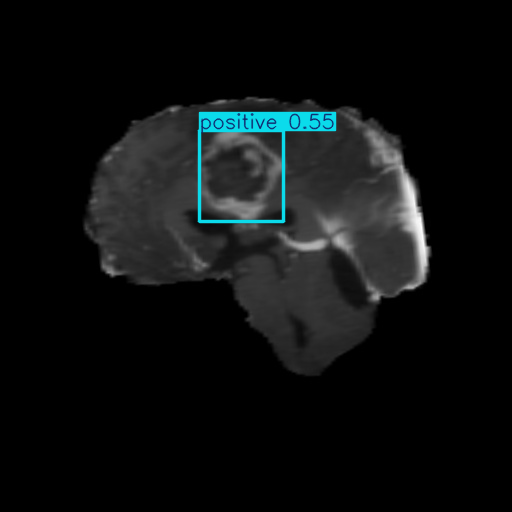

In [16]:
model = YOLO("/kaggle/working/runs/detect/train3/weights/best.pt")  

results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/test/00003_192.jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

<h2>Part 17</h2>


image 1/1 /kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/test/00053_165.jpg: 640x640 1 negative, 1 positive, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


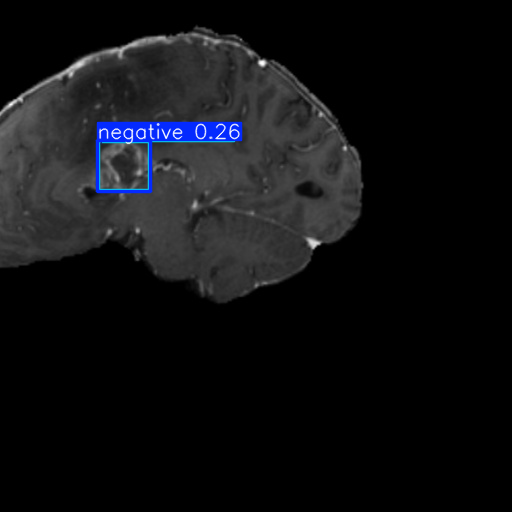

In [17]:
results = model.predict("/kaggle/input/brain-tumor-object-detection-datasets/sagittal_t1wce_2_class/images/test/00053_165.jpg")

results[0].show()

#References --> Md. Ismiel Hossen Abir, notebook=https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection

I tried to apply what I have learned so far, and it became one of the best-performing notebooks. It would not be possible without the Kaggle community's generous knowledge share. I tried many things, which include inspirations from others' works or using directly their codeblocks.

Special thanks to:





To David Roberts for part 1 - datasets=https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/data <br>
To DeepUnderstanding for part 1 - datasets=https://www.kaggle.com/datasets/davidbroberts/brain-tumor-object-detection-datasets/data <br>
To https://docs.ultralytics.com/quickstart/ for part 2 <br>
To https://docs.ultralytics.com/usage/python/ for part 4 <br>
To Md. Ismiel Hossen Abir for part 5 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 6 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 7 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To https://docs.ultralytics.com/usage/python/ for part 9 <br>
To Md. Ismiel Hossen Abir for part 10 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 11 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 12 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To https://docs.ultralytics.com/usage/python/ for part 14 <br>
To Md. Ismiel Hossen Abir for part 15 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 16 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>
To Md. Ismiel Hossen Abir for part 17 - https://www.kaggle.com/code/mdismielhossenabir/underwater-object-detection<br>


This notebook benefits best practices posted by the community